# Exploratory Spatio-Temporal Data Analysis
# Part 3 - Descriptive Statistics - Monthly Summary Statistics

In [1]:
import xarray as xr
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

import cartopy.crs as ccrs
import cartopy.feature as cfeature

from statsmodels.tsa.seasonal import seasonal_decompose

In [4]:
ds = xr.open_dataset('data/preprocessed_power_nasa_data.nc')

In [5]:
ds

<xarray.Dataset> Size: 169MB
Dimensions:            (timestamp: 8369, lat: 18, lon: 10)
Coordinates:
  * lat                (lat) float64 144B 5.0 5.5 6.0 6.5 ... 12.5 13.0 13.5
  * lon                (lon) float64 80B 36.25 36.88 37.5 ... 40.62 41.25 41.88
  * timestamp          (timestamp) datetime64[ns] 67kB 2001-01-01 ... 2023-11-30
Data variables: (12/14)
    PRECTOTCORR        (timestamp, lat, lon) float64 12MB ...
    EVPTRNS            (timestamp, lat, lon) float64 12MB ...
    T2M                (timestamp, lat, lon) float64 12MB ...
    TS                 (timestamp, lat, lon) float64 12MB ...
    CLOUD_AMT          (timestamp, lat, lon) float64 12MB ...
    PS                 (timestamp, lat, lon) float64 12MB ...
    ...                 ...
    QV2M               (timestamp, lat, lon) float64 12MB ...
    RH2M               (timestamp, lat, lon) float64 12MB ...
    ALLSKY_SFC_SW_DWN  (timestamp, lat, lon) float64 12MB ...
    GWETROOT           (timestamp, lat, lon) float64 12MB ...
    GWETPROF           (timestamp, lat, lon) float64 12MB ...
    GWETTOP            (timestamp, lat, lon) float64 12MB ...

## Descriptive statistics

### Summmary statistics

#### Monthly Summary Statistics

In [6]:
# Convert daily data to monthly by averaging
monthly_data = ds.resample(timestamp='ME').mean()

# Computing monthly averages specifically for the GWETROOT variable
monthly_soil_wetness = ds['GWETROOT'].resample(timestamp='ME').mean()

In [11]:
def plot_monthly_data(monthly_data):
    """
    Plots monthly climate data on a geographical map of Ethiopia using a colormap that highlights soil wetness variations.

    Parameters:
    - monthly_data (xarray.Dataset): The dataset containing the climate data.

    This function visualizes soil wetness for each month on a geographical map of Ethiopia.
    """
    # Define a custom colormap that starts with red and transitions to blue
    colors = ["red", "orange", "yellow", "green", "blue"]
    cmap = LinearSegmentedColormap.from_list("custom", colors, N=256)

    num_months = len(monthly_data.timestamp)
    ncols = 6
    nrows = (num_months + ncols - 1) // ncols
    fig = plt.figure(figsize=(18, 3 * nrows), dpi=200)  # Increased figure size and DPI for higher resolution

    # Define the geographic extent of Ethiopia
    ethiopia_extent = [33, 48, 3, 15]  # [lon_min, lon_max, lat_min, lat_max]

    for i, time in enumerate(monthly_data.timestamp):
        ax = fig.add_subplot(nrows, ncols, i + 1, projection=ccrs.PlateCarree())
        ax.coastlines(resolution='10m', color='black', linewidth=1)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.set_extent(ethiopia_extent, crs=ccrs.PlateCarree())  # Set the extent to cover Ethiopia
        
        # Plot the data
        soil_wetness = monthly_data.sel(timestamp=time)
        p = soil_wetness.plot(ax=ax, transform=ccrs.PlateCarree(), add_colorbar=False,
                              vmin=0, vmax=1, cmap=cmap)  # Custom colormap applied here
        
        ax.set_title(time.dt.strftime('%Y-%m').values)
    
    plt.tight_layout()
    
    # Add a colorbar with explicit settings
    fig.subplots_adjust(right=0.9)
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    fig.colorbar(p, cax=cbar_ax, label='Soil Wetness', extend='both')

    plt.show()


In [ ]:
# Example usage:
plot_monthly_data(monthly_soil_wetness)

In [9]:
def decompose_seasonality_monthly(ds, variable_name):
    """
    Decomposes a given variable from an xarray.Dataset to analyze monthly seasonality.
    
    Parameters:
    - ds (xarray.Dataset): The dataset containing the variable.
    - variable_name (str): The name of the variable to analyze.
    
    This function performs the following steps:
    1. Averages the variable over latitude and longitude dimensions.
    2. Corrects negative values setting them to zero.
    3. Converts the xarray.DataArray to a pandas DataFrame.
    4. Resamples the data to monthly averages.
    5. Applies seasonal decomposition on the monthly data.
    6. Plots the observed data, trend, seasonal, and residual components.
    
    Returns:
    - None: Plots the decomposition components.
    """
    
    # Check if the variable exists in the dataset
    if variable_name not in ds.variables:
        raise ValueError(f"Variable {variable_name} not found in the dataset.")
    
    # Average over the latitude and longitude dimensions
    data = ds[variable_name].mean(dim=['lat', 'lon'])

    # Correct negative values by setting them to zero
    data = data.where(data >= 0, 0)

    # Convert to pandas DataFrame for easier handling in statsmodels
    data_df = data.to_dataframe(name=variable_name).dropna()

    # Resample to monthly averages
    monthly_data = data_df.resample('ME').mean()

    # Decompose the time series to monthly data
    decomposition = seasonal_decompose(monthly_data, model='additive', period=12)

    # Plot the decomposed components
    fig, axes = plt.subplots(4, 1, figsize=(12, 8))
    titles = ['Observed', 'Trend', 'Seasonal', 'Residual']
    for ax, component, title in zip(axes, [decomposition.observed, decomposition.trend, decomposition.seasonal, decomposition.resid], titles):
        component.plot(ax=ax, title=title)
        ax.set_ylabel(variable_name)
        ax.label_outer()  # Hide x-labels for top 3 plots for clarity
    plt.tight_layout()
    plt.show()


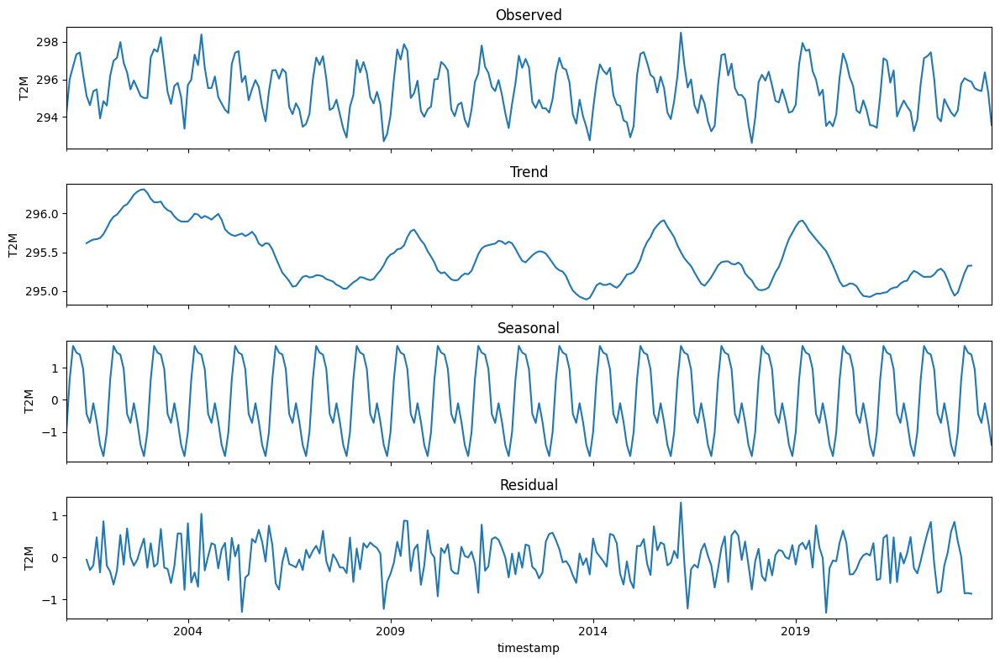

In [10]:
# Usage example:
decompose_seasonality_monthly(ds, 'T2M')